In [1]:
import xgboost as xgb
xgb.set_config(verbosity=0)
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
# plt.style.use('dark_background')
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

## Importing LuciferML
from luciferml.supervised.classification import Classification

``multivariate`` option is an experimental feature. The interface can change in the future.


In [4]:
dataset = pd.read_csv('../datasets/BodyPerformance.csv')

In [5]:
dataset.head()

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,24.0,F,152.4,42.5,23.4,57.0,112.0,27.4,14.2,50.0,184.0,C
1,27.0,F,162.1,70.9,35.7,97.0,148.0,30.6,11.0,42.0,157.0,D
2,23.0,M,173.7,68.3,13.6,76.0,137.0,47.7,16.5,48.0,208.0,C
3,31.0,M,168.2,70.5,15.5,82.0,145.0,39.6,19.9,66.0,264.0,C
4,25.0,M,175.1,64.8,6.9,65.0,118.0,42.0,19.8,49.0,252.0,B


In [6]:
dataset.shape

(7015, 12)

In [7]:
dataset.isnull().sum()

age                        0
gender                     0
height_cm                  0
weight_kg                  0
body fat_%                 0
diastolic                  0
systolic                   0
gripForce                  0
sit and bend forward_cm    0
sit-ups counts             0
broad jump_cm              0
class                      0
dtype: int64

## Luckily we don't have any null values.

In [8]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7015 entries, 0 to 7014
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      7015 non-null   float64
 1   gender                   7015 non-null   object 
 2   height_cm                7015 non-null   float64
 3   weight_kg                7015 non-null   float64
 4   body fat_%               7015 non-null   float64
 5   diastolic                7015 non-null   float64
 6   systolic                 7015 non-null   float64
 7   gripForce                7015 non-null   float64
 8   sit and bend forward_cm  7015 non-null   float64
 9   sit-ups counts           7015 non-null   float64
 10  broad jump_cm            7015 non-null   float64
 11  class                    7015 non-null   object 
dtypes: float64(10), object(2)
memory usage: 657.8+ KB


In [9]:
dataset.describe().T.style.bar(
    subset=['mean'],
    color='#606ff2').background_gradient(
    subset=['std'], cmap='PuBu').background_gradient(subset=['50%'], cmap='PuBu')

,count,mean,std,min,25%,50%,75%,max
age,7015.000000,36.801283,13.649180,21.000000,25.000000,32.000000,48.000000,64.000000
height_cm,7015.000000,168.751732,8.256259,125.000000,162.900000,169.400000,174.700000,193.800000
weight_kg,7015.000000,67.046887,11.242355,34.400000,58.500000,67.400000,74.700000,125.700000
body fat_%,7015.000000,22.642606,6.796773,3.500000,17.800000,22.200000,27.100000,54.900000
diastolic,7015.000000,78.648952,10.675237,6.000000,71.000000,79.000000,86.000000,156.200000
systolic,7015.000000,130.364490,14.538937,43.900000,120.000000,130.000000,141.000000,193.000000
gripForce,7015.000000,37.289624,10.443406,0.000000,27.800000,38.700000,45.200000,69.900000
sit and bend forward_cm,7015.000000,15.790925,6.973073,-20.000000,11.800000,16.000000,20.000000,213.000000
sit-ups counts,7015.000000,40.614597,13.075697,0.000000,32.000000,42.000000,50.000000,78.000000
broad jump_cm,7015.000000,191.824391,38.528746,0.000000,163.000000,195.000000,222.000000,295.000000


In [10]:
dataset = dataset.sort_values('age')

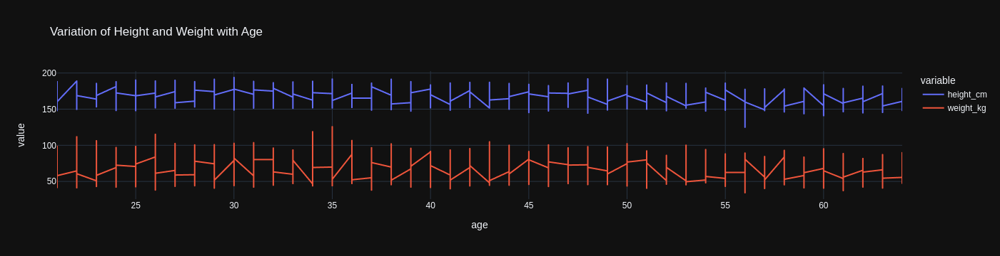

In [11]:
fig = px.line(dataset,x = 'age', y = ['height_cm','weight_kg'], template = 'plotly_dark', title = 'Variation of Height and Weight with Age')
fig.show()

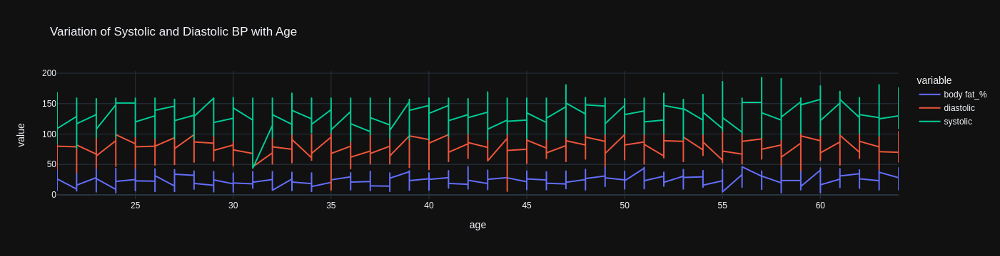

In [12]:
fig = px.line(dataset,x = 'age', y = ['body fat_%','diastolic', 'systolic'], template = 'plotly_dark', title = 'Variation of Systolic and Diastolic BP with Age')
fig.show()

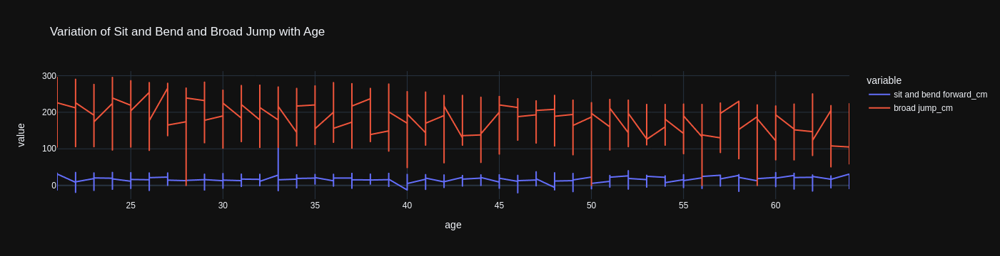

In [13]:
fig = px.line(dataset,x = 'age', y = ['sit and bend forward_cm','broad jump_cm'], template = 'plotly_dark', title = 'Variation of Sit and Bend and Broad Jump with Age')
fig.show()

## From above visualisations you can see the data is ditributed over all age intervals

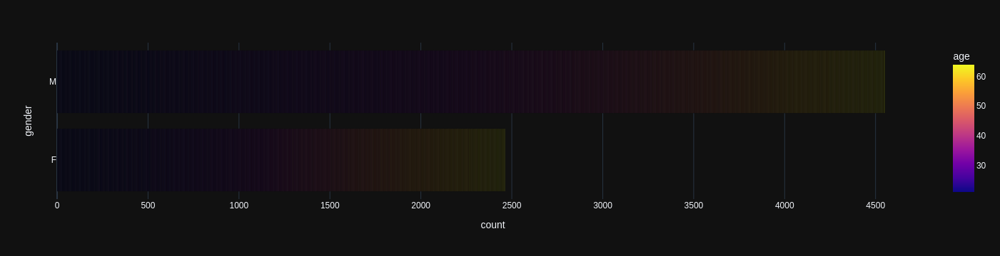

In [14]:
fig = px.bar(dataset, y = 'gender',color="age", template = 'plotly_dark')
fig.show()

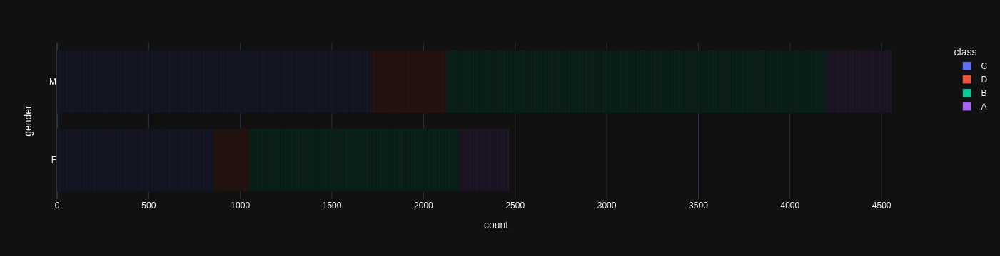

In [15]:
fig = px.bar(dataset, y = 'gender',color="class", template = 'plotly_dark')
fig.show()

## From above visualisations you can see we clearly have more data for Males as compared to Females and therefore more 'A class individuals are Males'

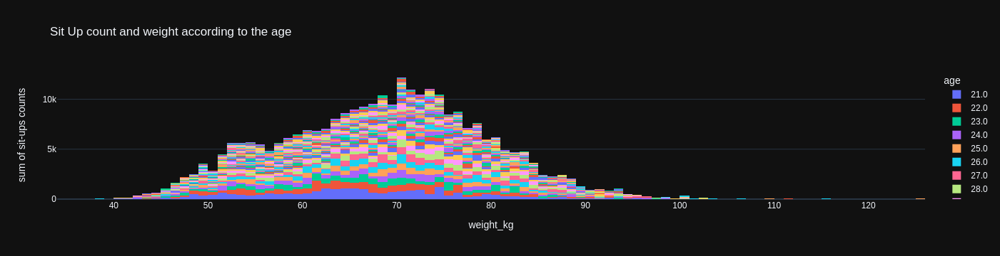

In [16]:
fig = px.histogram(dataset, y="sit-ups counts", x="weight_kg", color="age",
                   hover_data=dataset.columns, template = 'plotly_dark', title = 'Sit Up count and weight according to the age')
fig.show()

## From above visualisation you can see people who are having weight b/w 65-80 are able to do more situps

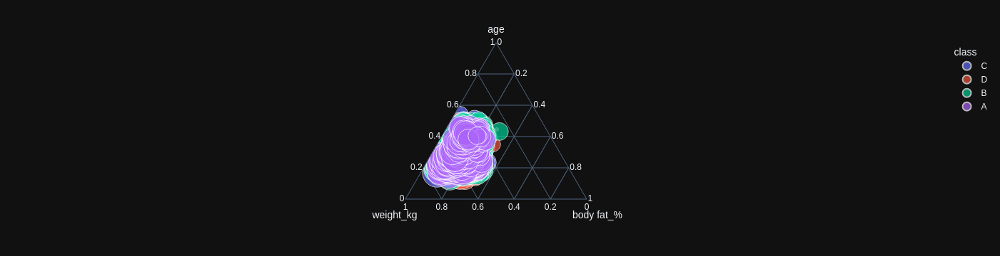

In [17]:
fig = px.scatter_ternary(dataset, a="age", b="weight_kg", c="body fat_%",hover_name="height_cm",
    color="class", template = 'plotly_dark',size="sit-ups counts", size_max=30,)
fig.show()

## From above scatter plot we can see the individuals who are young have low weight and low body fat

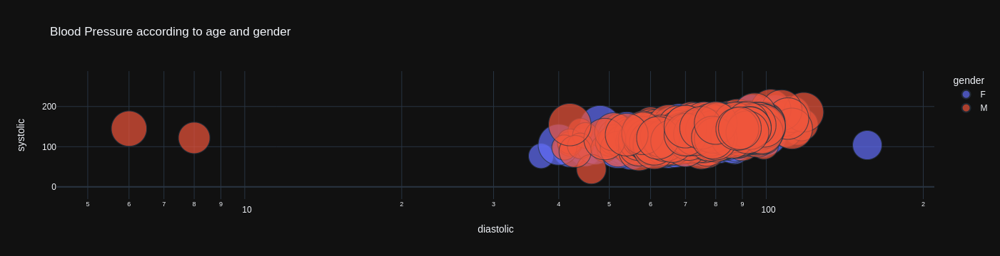

In [18]:
fig = px.scatter(dataset,
                 x="diastolic", y='systolic', size="age", color="gender",
                 log_x=True, size_max=60,
                 template='plotly_dark', title='Blood Pressure according to age and gender')
fig.show()

## From above plot we can see there are 2 Male outliers who are having really low diastolic pressure. 
## Most of the females are having low Blood pressure problem and Males have normal Blood Pressure

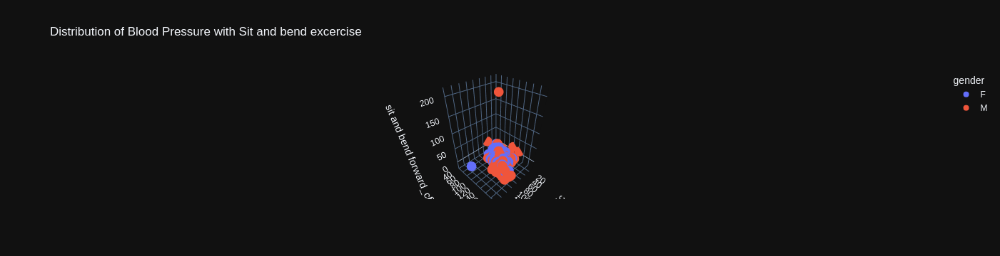

In [19]:
fig = px.scatter_3d(dataset, x='diastolic', y='systolic', z='sit and bend forward_cm',
              color='gender', template = 'plotly_dark', title = 'Distribution of Blood Pressure with Sit and bend excercise')
fig.show()

## From above plot we can see that:
### 1. There are only two Male Candidates who are able to do sit and bend forward exercise above 150 cm
### 2. Males are having high blood pressure eventhough they are not able to achive more distance

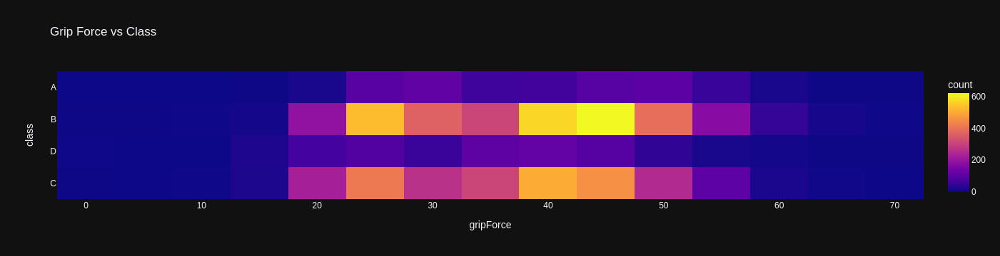

In [20]:
fig = px.density_heatmap(dataset, x="gripForce", y ="class",title = 'Grip Force vs Class', template = 'plotly_dark')
fig.show()

## From above plot we can see:
### 1. Most Class A candidates have a gripforce range from 25 to 30 units
### 2. Most Class B candidates have a gripforce range from 40 to 50 units
### 3. Most Class C candidates have a gripforce range from 38 to 42 units
### 4. Most Class D candidates have a gripforce range from 37 to 40 units

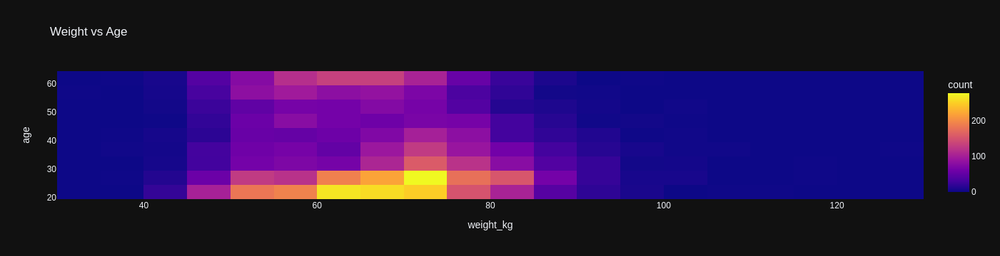

In [21]:
fig = px.density_heatmap(dataset, x="weight_kg", y ="age",title = 'Weight vs Age', template = 'plotly_dark')
fig.show()

## From above plot we can see:
### 1. Maximum individual b/w age 25-29 years have weight from 70 to 74 Kg


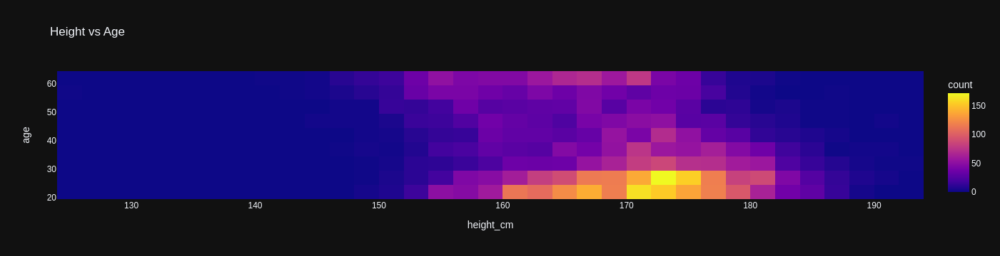

In [22]:
fig = px.density_heatmap(dataset, x="height_cm", y ="age",title = 'Height vs Age', template = 'plotly_dark')
fig.show()

## From above plot we can see:
### 1. Candidates with age from 25 to 29 have height from 170-175 cm


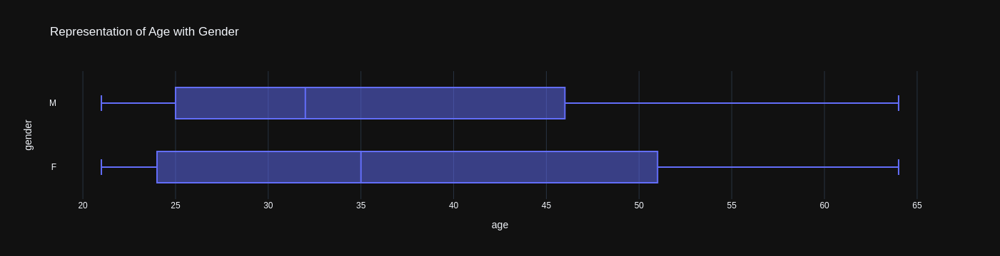

In [23]:
fig = px.box(dataset, x="age", y="gender", template = 'plotly_dark', 
             title = 'Representation of Age with Gender')
fig.show()

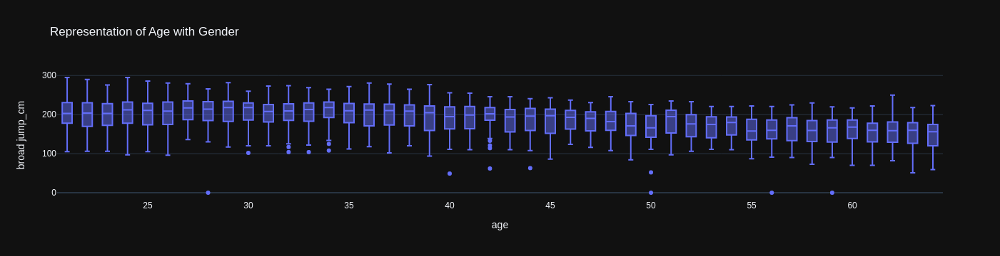

In [24]:
fig = px.box(dataset, x="age", y="broad jump_cm", template = 'plotly_dark', 
             title = 'Representation of Age with Gender')
fig.show()

## From above plot we can see there are certain outliers in most age intervals

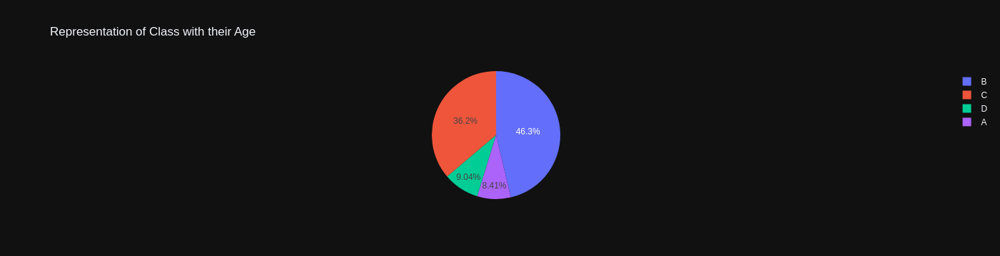

In [25]:
fig = px.pie(dataset, names='class', values='age', template = 'plotly_dark', 
             title = 'Representation of Class with their Age')
fig.show()

## From above plot we can see that age wise most candidate fall under Class D.

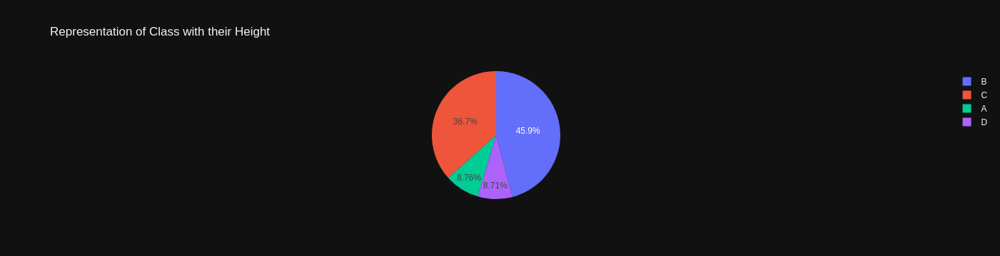

In [26]:
fig = px.pie(dataset, names='class', values='height_cm', template = 'plotly_dark', 
             title = 'Representation of Class with their Height')
fig.show()

## From above plot we can see that height wise most candidate fall under Class D.

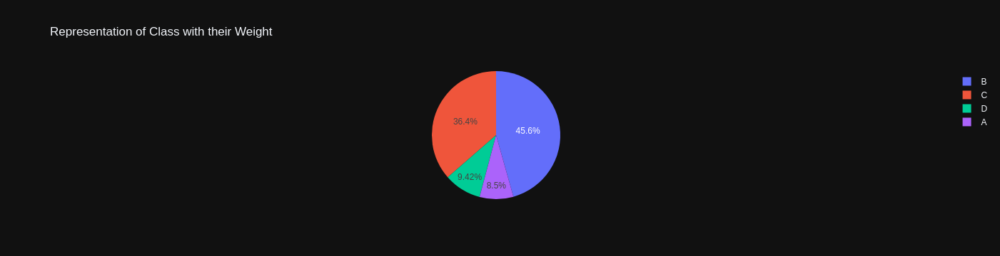

In [27]:
fig = px.pie(dataset, names='class', values='weight_kg', template = 'plotly_dark', 
             title = 'Representation of Class with their Weight')
fig.show()

## From above plot we can see that weight wise most candidate fall under Class D.

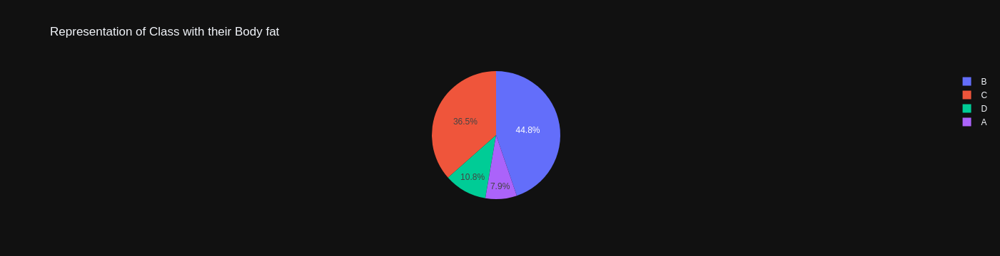

In [28]:
fig = px.pie(dataset, names='class', values='body fat_%', template = 'plotly_dark', 
             title = 'Representation of Class with their Body fat')
fig.show()

## From above plot we can see that Class D candidates have higher body fat as compared to others.

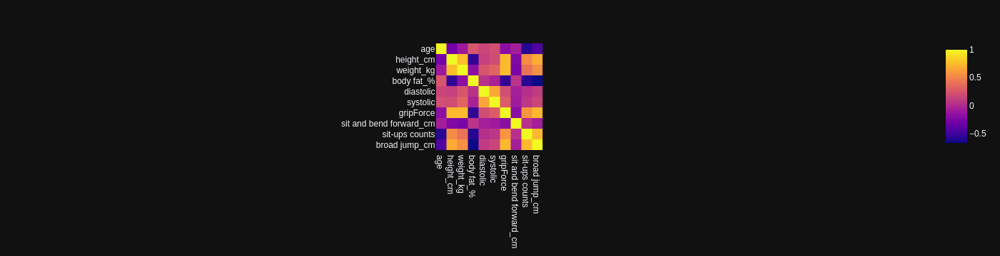

In [29]:
fig = px.imshow(dataset.corr(), template = 'plotly_dark')
fig.show()

## From above plot we can say that:
1. Height and Weight are linearly dependent
2. Body Fat and Broad jump are inversely dependent
3. Height and gripforce are linearly dependent
4. Gripforce and sit up counts are linearly dependent

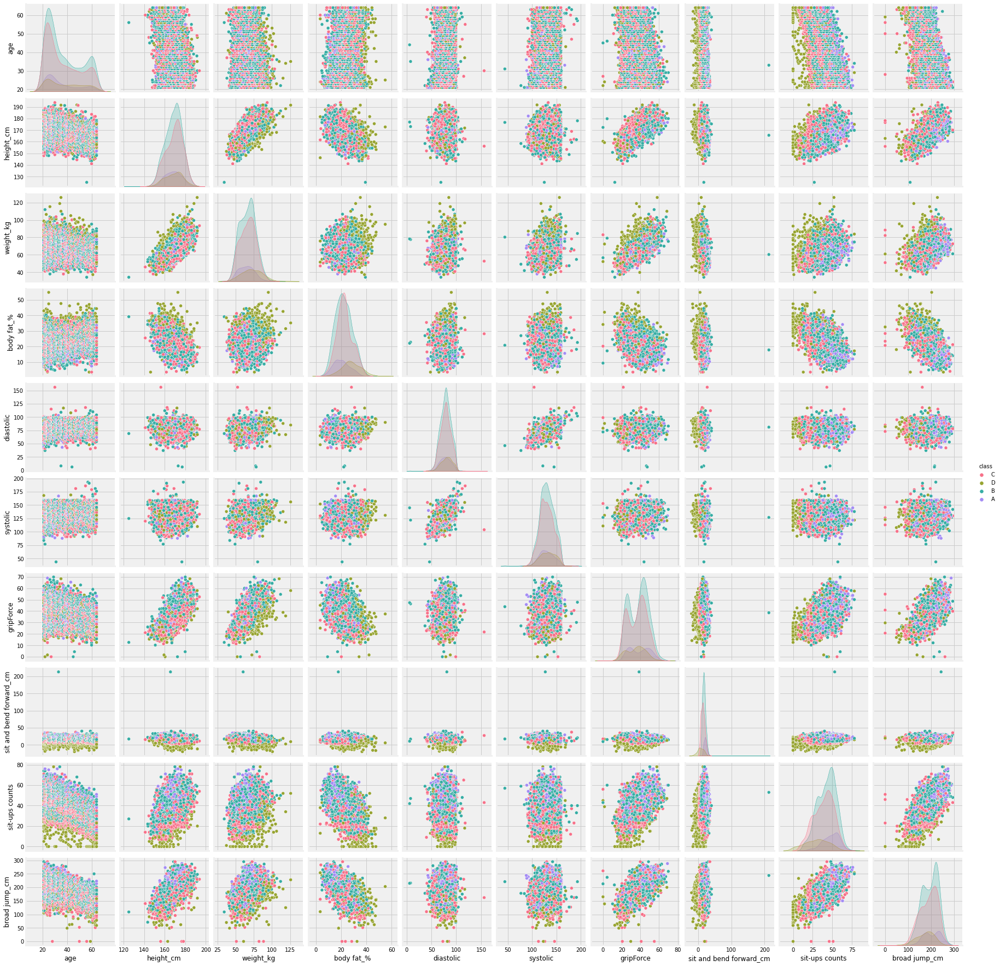

In [30]:
sns.pairplot(dataset, hue="class", palette="husl");

In [32]:
dataset.gender.replace({"F": 0, "M": 1}, inplace=True)
dataset["class"].replace({"A": 0, "B": 1, "C": 2, "D": 3}, inplace=True)

In [33]:
features = dataset.iloc[:, :-1]
labels = dataset.iloc[:, -1]

In [34]:
classifier = Classification(predictor=['all'], smote='y', exclude_models=['ridg'])


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝
 

Started LuciferML [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training CatBoostClassifier on Training Set [*]

Model Trained Successfully [ ✓ ]

Evaluating Model Performance [*]

        Validation Accuracy is : 84.41 %
        KFold Accuracy: 83.86 %
        Standard Deviation: 0.96 % 



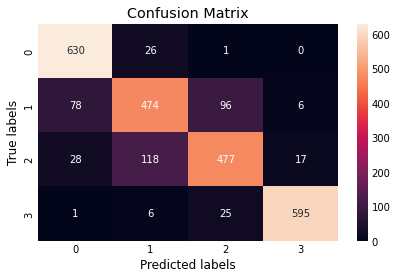

Model Evaluation Completed [ ✓ ]

Tuning Started [*]



`n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
[W 2022-06-29 15:14:48,541] Trial 3 failed because of the following error: CatBoostError('only one of the parameters rsm, colsample_bylevel should be initialized.',)
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py", line 436, in _process_worker
    r = call_item()
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py", line 288, in __call__
    return self.fn(*self.args, **self.kwargs)
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/_parallel_backends.py", line 595, in __call__
    return self.func(*args, **kwargs)
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/paralle

HyperParam Tuning Failed with Error:  The Executor was shutdown with `kill_workers=True` before this job could complete. 

Tuning Done [ ✓ ]

Completed LuciferML Run [ ✓ ]

Time Elapsed :  59.51 seconds 



In [39]:
classifier.fit(features, labels)

In [40]:
classifier.best_classifier.summary()


Best Model Summary:
Name:  LightGBM Classifier
Accuracy:  85.37626066718387
KFold Accuracy:  84.55868089233753
Best Parameters:  {'learning_rate': 0.1, 'num_leaves': 1614, 'lambda_l1': 8.881002320022972e-06, 'lambda_l2': 1.8839597191779005e-07, 'feature_fraction': 0.5913985984748303, 'bagging_fraction': 0.8004951230083182, 'bagging_freq': 6, 'min_data_in_leaf': 23, 'extra_trees': False}
Best Accuracy:  86.6925315227934




In [41]:
classifier = Classification(predictor=['lgbm','cat'], smote='y', tune=True,lgbm_objective='multiclass')

In [42]:
classifier.fit(features,labels)


          
██╗░░░░░██╗░░░██╗░█████╗░██╗███████╗███████╗██████╗░░░░░░░███╗░░░███╗██╗░░░░░
██║░░░░░██║░░░██║██╔══██╗██║██╔════╝██╔════╝██╔══██╗░░░░░░████╗░████║██║░░░░░
██║░░░░░██║░░░██║██║░░╚═╝██║█████╗░░█████╗░░██████╔╝█████╗██╔████╔██║██║░░░░░
██║░░░░░██║░░░██║██║░░██╗██║██╔══╝░░██╔══╝░░██╔══██╗╚════╝██║╚██╔╝██║██║░░░░░
███████╗╚██████╔╝╚█████╔╝██║██║░░░░░███████╗██║░░██║░░░░░░██║░╚═╝░██║███████╗
╚══════╝░╚═════╝░░╚════╝░╚═╝╚═╝░░░░░╚══════╝╚═╝░░╚═╝░░░░░░╚═╝░░░░░╚═╝╚══════╝
 

Started LuciferML [ ✓ ]

Preprocessing Started [*]

Preprocessing Done [ ✓ ]

Training LuciferML [*]



`n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
`n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
[W 2022-06-29 15:19:53,525] Trial 3 failed because of the following error: CatBoostError('only one of the parameters rsm, colsample_bylevel should be initialized.',)
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py", line 436, in _process_worker
    r = call_item()
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/externals/loky/process_executor.py", line 288, in __call__
    return self.fn(*self.args, **self.kwargs)
  File "/home/inomjon/.conda/envs/feather/lib/python3.6/site-packages/joblib/_parallel_backends.py

HyperParam Tuning Failed with Error:  only one of the parameters rsm, colsample_bylevel should be initialized. 

Training Done [ ✓ ]

Results Below



,Name,Accuracy,KFold Accuracy,Model,Best Parameters,Best Accuracy
0,LightGBM Classifier,85.376261,84.558681,LGBMClassifier(),"{'learning_rate': 0.1, 'num_leaves': 456, 'lam...",86.382153
1,CatBoost Classifier,84.406517,83.860330,<catboost.core.CatBoostClassifier object at 0x...,None,0.000000



Completed LuciferML Run [ ✓ ]

Saved Best Model to lucifer_ml_info/best/classifier/models/LightGBM_Classifier_1656497995.pkl and its scaler to lucifer_ml_info/best/classifier/scalers/LightGBM_Classifier_Scaler_1656497995.pkl 

Time Elapsed :  288.57 seconds 

